In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import scipy.stats as stats
from scipy.stats import zscore
from datetime import datetime
from datetime import timedelta
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose, STL
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
df=pd.read_csv(r"https://raw.githubusercontent.com/FuTSA23/time-series-analysis-datasets/main/Complete_Blasting_info%20(1).csv")
df

,Unnamed: 0,PM10 (µg/m3),Time,Date,NO (µg/m3),PM2.5 (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),Ozone (µg/m3),Benzene (µg/m3)
0,0,95.0,00:00:00,2023-02-01,14.484070,35.0,90.1,56.2,0.310000,11.986833,17.7,28.1,0.4
1,1,95.0,00:15:00,2023-02-01,14.484070,35.0,88.0,55.1,0.330000,11.986833,18.3,27.1,0.4
2,2,95.0,00:30:00,2023-02-01,15.835914,35.0,87.7,55.2,0.380000,10.912796,19.7,24.9,0.4
3,3,122.0,00:45:00,2023-02-01,15.914518,34.0,88.9,55.7,0.380000,10.613291,21.3,21.9,0.4
4,4,122.0,01:00:00,2023-02-01,16.035640,34.0,90.0,55.8,0.380000,7.362361,22.3,16.7,0.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8635,8635,19.0,22:45:00,2023-05-01,17.900000,11.0,100.0,67.8,0.630000,10.000000,10.7,26.1,0.1
8636,8636,19.0,23:00:00,2023-05-01,17.900000,11.0,100.0,67.7,0.570000,10.000000,10.4,30.9,0.1
8637,8637,19.0,23:15:00,2023-05-01,19.600000,11.0,100.2,69.2,0.580000,9.900000,10.5,29.6,0.1
8638,8638,19.0,23:30:00,2023-05-01,20.800000,11.0,100.2,70.2,0.580000,9.500000,10.8,30.0,0.1


In [2]:
df.isna().sum()

Unnamed: 0         0
PM10 (µg/m3)       0
Time               0
Date               0
NO (µg/m3)         0
PM2.5 (µg/m3)      0
NO2 (µg/m3)        0
NOX (ppb)          0
CO (mg/m3)         0
SO2 (µg/m3)        0
NH3 (µg/m3)        0
Ozone (µg/m3)      0
Benzene (µg/m3)    0
dtype: int64

In [3]:
#NO Null Values

In [4]:
df.describe()

,Unnamed: 0,PM10 (µg/m3),NO (µg/m3),PM2.5 (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),Ozone (µg/m3),Benzene (µg/m3)
count,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000,8640.000000
mean,4319.500000,165.140621,14.269630,74.626459,56.128353,42.457154,1.392857,33.727472,13.160495,35.765681,0.177505
std,2494.297496,128.089107,17.986445,54.992383,20.328553,22.129798,0.626985,38.878154,6.095797,26.549469,0.052601
min,0.000000,-13.488183,0.100000,3.000000,0.200000,4.200000,0.100000,0.100000,4.600000,0.100000,0.100000
25%,2159.750000,79.000000,4.000000,36.000000,39.575000,25.100000,0.930000,15.000000,9.400000,11.000000,0.177505
50%,4319.500000,127.000000,6.600000,59.000000,53.800000,37.500000,1.390000,24.200000,11.000000,33.000000,0.177505
75%,6479.250000,208.000000,17.121285,100.000000,71.500000,53.300000,1.832500,36.100000,13.900000,58.125000,0.177505
max,8639.000000,847.000000,157.500000,474.000000,106.900000,165.200000,4.000000,645.600000,62.400000,123.800000,0.600000


In [5]:
df.dtypes


Unnamed: 0           int64
PM10 (µg/m3)       float64
Time                object
Date                object
NO (µg/m3)         float64
PM2.5 (µg/m3)      float64
NO2 (µg/m3)        float64
NOX (ppb)          float64
CO (mg/m3)         float64
SO2 (µg/m3)        float64
NH3 (µg/m3)        float64
Ozone (µg/m3)      float64
Benzene (µg/m3)    float64
dtype: object

In [6]:
#Converting the date and time columns to a timestamp, and making it as the address.

In [7]:
df.set_index(pd.to_datetime(df.Date + " " + df.Time),inplace =True)
df.drop(['Date','Time'],axis=1, inplace=True)
df.drop(df.columns[[0]],axis=1,inplace=True)
df

,PM10 (µg/m3),NO (µg/m3),PM2.5 (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),Ozone (µg/m3),Benzene (µg/m3)
2023-02-01 00:00:00,95.0,14.484070,35.0,90.1,56.2,0.310000,11.986833,17.7,28.1,0.4
2023-02-01 00:15:00,95.0,14.484070,35.0,88.0,55.1,0.330000,11.986833,18.3,27.1,0.4
2023-02-01 00:30:00,95.0,15.835914,35.0,87.7,55.2,0.380000,10.912796,19.7,24.9,0.4
2023-02-01 00:45:00,122.0,15.914518,34.0,88.9,55.7,0.380000,10.613291,21.3,21.9,0.4
2023-02-01 01:00:00,122.0,16.035640,34.0,90.0,55.8,0.380000,7.362361,22.3,16.7,0.4
...,...,...,...,...,...,...,...,...,...,...
2023-05-01 22:45:00,19.0,17.900000,11.0,100.0,67.8,0.630000,10.000000,10.7,26.1,0.1
2023-05-01 23:00:00,19.0,17.900000,11.0,100.0,67.7,0.570000,10.000000,10.4,30.9,0.1
2023-05-01 23:15:00,19.0,19.600000,11.0,100.2,69.2,0.580000,9.900000,10.5,29.6,0.1
2023-05-01 23:30:00,19.0,20.800000,11.0,100.2,70.2,0.580000,9.500000,10.8,30.0,0.1


In [8]:
#Plotting specific graphs for pollutants

In [9]:
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
print("Correlation matrix:")
print(correlation_matrix)

trace=(go.Scatter(x=df.index, y=df['PM10 (µg/m3)'], name='PM10 (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="PM10 (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['NO (µg/m3)'], name='NO (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="NO (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['PM2.5 (µg/m3)'], name='PM2.5 (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="PM2.5 (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['NO2 (µg/m3)'], name='NO2 (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="NO2 (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['NOX (ppb)'], name='NOX (ppb)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="NOX (ppb)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['CO (mg/m3)'], name='CO (mg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="CO (mg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['SO2 (µg/m3)'], name='SO2 (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="SO2 (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['NH3 (µg/m3)'], name='NH3 (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="NH3 (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['Ozone (µg/m3)'], name='Ozone (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="Ozone (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

trace=(go.Scatter(x=df.index, y=df['Benzene (µg/m3)'], name='Benzene (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="Benzene (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()

Correlation matrix:
                 PM10 (µg/m3)  NO (µg/m3)  PM2.5 (µg/m3)  NO2 (µg/m3)  \
PM10 (µg/m3)         1.000000    0.338057       0.519071     0.111211   
NO (µg/m3)           0.338057    1.000000       0.589850     0.293774   
PM2.5 (µg/m3)        0.519071    0.589850       1.000000     0.184725   
NO2 (µg/m3)          0.111211    0.293774       0.184725     1.000000   
NOX (ppb)            0.376677    0.810308       0.528303     0.721059   
CO (mg/m3)           0.237630    0.339828       0.413555    -0.075715   
SO2 (µg/m3)         -0.066691    0.013893      -0.037140     0.166727   
NH3 (µg/m3)          0.126787    0.010689       0.049492     0.239725   
Ozone (µg/m3)       -0.272115   -0.535566      -0.498535    -0.427005   
Benzene (µg/m3)      0.333491    0.155600       0.367714     0.018227   

                 NOX (ppb)  CO (mg/m3)  SO2 (µg/m3)  NH3 (µg/m3)  \
PM10 (µg/m3)      0.376677    0.237630    -0.066691     0.126787   
NO (µg/m3)        0.810308    0.339828  

In [10]:
# Calculating Z-score and filtering it
for col in df.columns:
    df['z_score'] = zscore(df[col])
    df_filter = df.loc[df['z_score']<3]

df_filter

,PM10 (µg/m3),NO (µg/m3),PM2.5 (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),Ozone (µg/m3),Benzene (µg/m3),z_score
2023-02-01 10:30:00,99.0,7.109905,31.0,76.0,44.3,0.270000,48.422375,28.2,49.2,0.2,0.427678
2023-02-01 10:45:00,64.0,4.865085,22.0,75.1,44.2,0.250000,50.929625,26.6,50.4,0.1,-1.473544
2023-02-01 11:00:00,64.0,5.082303,22.0,75.4,43.8,0.240000,59.562409,25.8,51.7,0.1,-1.473544
2023-02-01 11:15:00,64.0,5.550451,22.0,74.9,42.9,0.230000,59.562409,24.8,53.4,0.1,-1.473544
2023-02-01 11:30:00,64.0,6.967527,22.0,73.2,41.6,0.220000,59.562409,24.9,52.1,0.1,-1.473544
...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01 22:45:00,19.0,17.900000,11.0,100.0,67.8,0.630000,10.000000,10.7,26.1,0.1,-1.473544
2023-05-01 23:00:00,19.0,17.900000,11.0,100.0,67.7,0.570000,10.000000,10.4,30.9,0.1,-1.473544
2023-05-01 23:15:00,19.0,19.600000,11.0,100.2,69.2,0.580000,9.900000,10.5,29.6,0.1,-1.473544
2023-05-01 23:30:00,19.0,20.800000,11.0,100.2,70.2,0.580000,9.500000,10.8,30.0,0.1,-1.473544


In [11]:
# Resampling Data
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARMA

df.index = pd.to_datetime(df.index)
df_daily = df.resample('D').mean()

df_daily.reset_index(inplace=True)
df_daily

,index,PM10 (µg/m3),NO (µg/m3),PM2.5 (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),Ozone (µg/m3),Benzene (µg/m3),z_score
0,2023-02-01,114.739583,13.132339,35.145833,78.736355,48.427731,0.459579,24.470951,21.961735,32.464022,0.232292,1.041614
1,2023-02-02,177.458333,13.133785,52.020833,79.080065,53.530713,1.308402,24.470951,21.994402,25.927085,0.120599,-1.081911
2,2023-02-03,171.270833,13.133785,52.916667,82.130105,56.451690,1.213121,24.470951,22.978402,27.856273,0.165625,-0.225867
3,2023-02-04,203.638156,13.133785,70.718088,76.301809,53.037640,1.136366,24.470951,24.657890,27.714844,0.184011,0.123686
4,2023-02-05,233.949370,13.133785,78.273340,74.351214,63.246840,0.877379,24.470951,23.682582,25.095753,0.209688,0.611871
...,...,...,...,...,...,...,...,...,...,...,...,...
85,2023-04-27,65.645833,7.341570,29.031250,72.598855,44.525648,0.439397,23.535256,10.766943,47.856273,0.154899,-0.429784
86,2023-04-28,123.281250,22.432195,48.572917,78.609272,59.986065,1.329788,21.484214,11.008610,40.700023,0.100000,-1.473544
87,2023-04-29,72.458333,6.633237,34.479167,82.025938,48.961065,0.729273,23.756089,10.777360,41.678002,0.100000,-1.473544
88,2023-04-30,57.204259,6.942838,18.615056,88.673722,52.628948,0.402733,9.249085,10.091081,32.138486,0.100807,-1.458194


In [12]:
#Defining time interval for Trainning of Arma and Arima Model

start_date = datetime(2023,2,1)
end_date =datetime(2023,5,1)
train_df = df[start_date:end_date]
first_diff = train_df.diff()[1:]

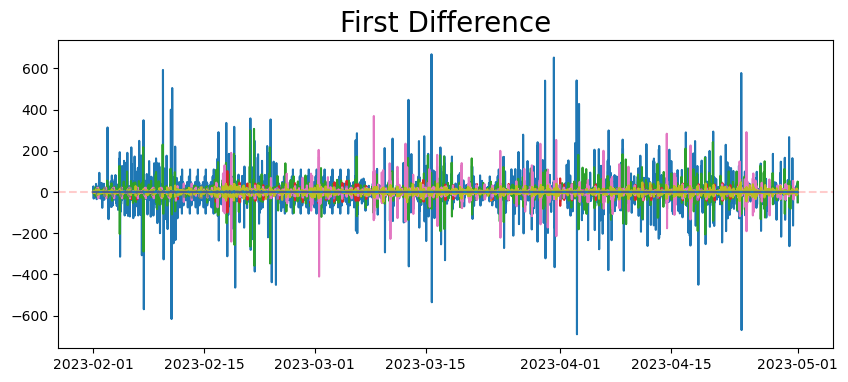

In [13]:
# Plotting first difference for data

plt.figure(figsize=(10,4))
plt.plot(first_diff)
plt.title('First Difference', fontsize=20)
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
plt.axhline(0, color='r', alpha=0.2, linestyle='--')
plt.show()

Text(0.5, 1.0, 'First Difference for SO2')

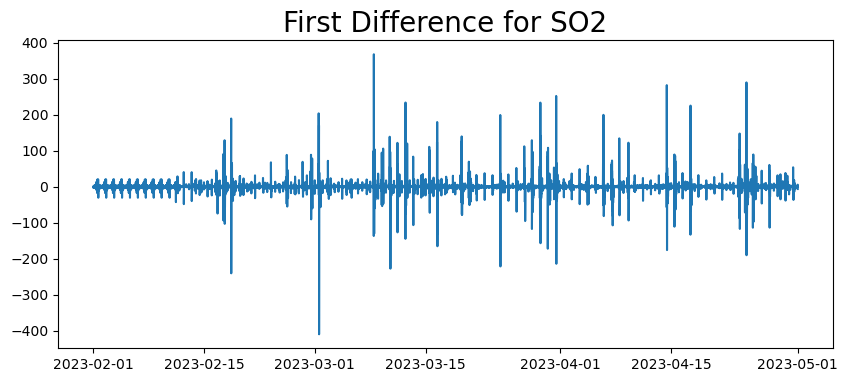

In [14]:
#Specifically plotting for SO2

plt.figure(figsize=(10,4))
plt.plot(first_diff["SO2 (µg/m3)"])
plt.title('First Difference for SO2', fontsize=20)

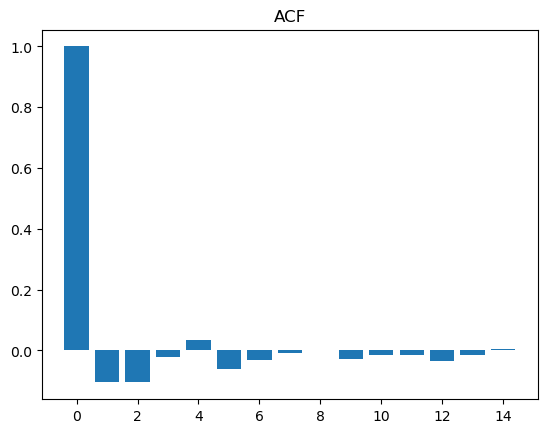

In [15]:
#plotting bar graph for autocorrelation values

acf_vals = acf(first_diff["SO2 (µg/m3)"])
plt.bar(range(15), acf_vals[:15])
plt.title("ACF")
plt.show()

Text(0.5, 1.0, 'PACF')

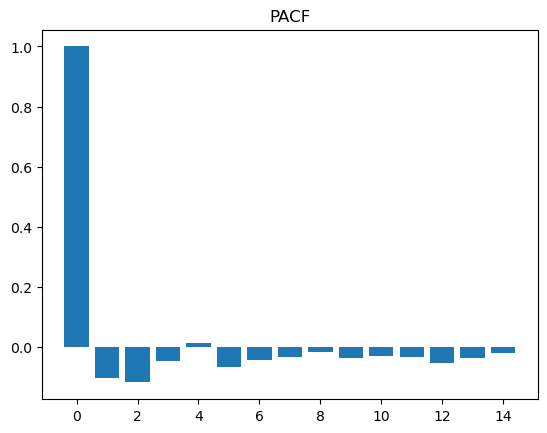

In [16]:
# plotting bar graphs for partial autocorrelation function
pacf_vals = pacf(first_diff["SO2 (µg/m3)"])
plt.bar(range(15), pacf_vals[:15])
plt.title("PACF")

In [17]:
# defining test time for model
train_end = datetime(2023,4,1)
test_end = datetime(2023,5,1)

train_data = first_diff[:train_end]
test_data = first_diff[train_end + timedelta(days=1):test_end]

In [18]:
#Applying ARMA model

from statsmodels.tsa.api import AutoReg

lag_order = 2
train_data.index = pd.DatetimeIndex(train_data.index, freq='15T')
model = AutoReg(train_data["SO2 (µg/m3)"], lags=lag_order, trend='c')

model_fit = model.fit()

predictions = model_fit.predict(start=len(train_data["SO2 (µg/m3)"]), end=len(train_data["SO2 (µg/m3)"])+len(test_data["SO2 (µg/m3)"])-1)
print(model_fit.summary())

                            AutoReg Model Results                             
Dep. Variable:            SO2 (µg/m3)   No. Observations:                 5664
Model:                     AutoReg(2)   Log Likelihood              -24647.025
Method:               Conditional MLE   S.D. of innovations             18.805
Date:                Sun, 30 Jul 2023   AIC                          49302.049
Time:                        23:11:13   BIC                          49328.615
Sample:                    02-01-2023   HQIC                         49311.302
                         - 04-01-2023                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0009      0.250      0.004      0.997      -0.489       0.491
SO2 (µg/m3).L1    -0.0837      0.013     -6.388      0.000      -0.109      -0.058
SO2 (µg/m3).L2    -0.1674      0.013

In [19]:
# Both Lag1 and Lag2 are significant as P-values for these are less than 0.05 and coefficients corresponding to these are -0.0837 and -0.1674

In [20]:
n = int(len(df) * (0.8))

train = df["PM10 (µg/m3)"][:n]
train.index = pd.DatetimeIndex(train.index, freq='15T')
test = df["PM10 (µg/m3)"][n:]

In [21]:
print(len(train))
print(len(test))

6912
1728


In [22]:
model =  sm.tsa.arima.ARIMA(train, order=(2,1,2))
result=model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           PM10 (µg/m3)   No. Observations:                 6912
Model:                 ARIMA(2, 1, 2)   Log Likelihood              -36274.722
Date:                Sun, 30 Jul 2023   AIC                          72559.443
Time:                        23:11:18   BIC                          72593.648
Sample:                    02-01-2023   HQIC                         72571.237
                         - 04-13-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0178      0.029     -0.620      0.535      -0.074       0.038
ar.L2          0.8505      0.023     36.546      0.000       0.805       0.896
ma.L1         -0.0433      0.024     -1.802      0.072      -0.090       0.004
ma.L2         -0.9432      0.023    -40.585      0.000      -0.989      -0.898
sigma2      2121.0149      8.516    249.062      0.000    2104.324    2137.706
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):            798839.44
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               0.82   Skew:                             0.96
Prob(H) (two-sided):                  0.00   Kurtosis:                        55.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [23]:
#. It can be observed that ar.L2 and ma.L2 are significant as p-values are less than 0.05 for these and coefficients for these are 0.8505 and -0.9432

In [24]:
# forecasting values for next 30 days
step=30
forecast_values=[]
for x in range(0,30):
   forecast_values.append(result.forecast(step)[x])
print(forecast_values)

[238.745264518382, 237.5902093383613, 233.14153651512132, 232.23826904844296, 228.47068410786952, 227.7694517874817, 224.5775470411588, 224.03790941450265, 221.33275359883908, 220.92189724110213, 218.62843684141833, 218.31978838713405, 216.37466210012326, 216.14674748023336, 214.4964476767524, 214.3319545848837, 212.93128028621499, 212.81628830920243, 211.62704311707805, 211.55039210937815, 210.54028801342264, 210.49306038803337, 209.63479464839364, 209.6098914769449, 208.8803690410284, 208.87216335133755, 208.25184167608404, 208.25589523006866, 207.72823208258654, 207.74106431348673]


In [25]:
#Obtained Values

n=len(test)
result1 = result.get_forecast(n).summary_frame()
print(result1["mean"])

2023-04-14 00:00:00    238.745265
2023-04-14 00:15:00    237.590209
2023-04-14 00:30:00    233.141537
2023-04-14 00:45:00    232.238269
2023-04-14 01:00:00    228.470684
                          ...    
2023-05-01 22:45:00    205.122007
2023-05-01 23:00:00    205.122007
2023-05-01 23:15:00    205.122007
2023-05-01 23:30:00    205.122007
2023-05-01 23:45:00    205.122007
Freq: 15T, Name: mean, Length: 1728, dtype: float64


In [26]:
df['Pollutants (µg/m3)']=df['PM10 (µg/m3)']+df['NO (µg/m3)']+df['PM2.5 (µg/m3)']+df['NO2 (µg/m3)']+df['NOX (ppb)']*1.22+df['CO (mg/m3)']*1000+df['SO2 (µg/m3)']+df['NH3 (µg/m3)']+df['Ozone (µg/m3)']+df['Benzene (µg/m3)']
df_p=pd.DataFrame(df['Pollutants (µg/m3)'])
df_p.index=df_p.index.strftime("%H:%M:%S")
df_p.index=pd.to_datetime(df_p.index)
df_p=df_p.resample("15t").mean()
trace=(go.Scatter(x=df_p.index, y=df_p['Pollutants (µg/m3)'], name='Pollutants (µg/m3)', mode='lines'))
fig = go.Figure(data=trace)
fig.update_layout(height=600, width=1200, title_text="Pollutants (µg/m3)")
fig.update_yaxes(title_text='Concentration(ug/m3)')
fig.update_xaxes(title_text='DateTime')
fig.show()
df_p.loc[df_p['Pollutants (µg/m3)']==df_p['Pollutants (µg/m3)'].max()]

,Pollutants (µg/m3)
2023-07-30 10:00:00,2444.398242


In [27]:
#Max pollution at 10:00:00
# Checking How these are correlated through covariance matrix

correlation = df['PM10 (µg/m3)'].corr(df['NO (µg/m3)'])
print("Correlation between PM10 and NO is:", correlation)

Correlation between PM10 and NO is: 0.3380571536446302


In [28]:
correlation = df['PM10 (µg/m3)'].corr(df['PM2.5 (µg/m3)'])
print("Correlation between PM10 and PM2.5 is:", correlation)

Correlation between PM10 and PM2.5 is: 0.5190708191202136


In [29]:
df=pd.read_csv(r"https://raw.githubusercontent.com/FuTSA23/time-series-analysis-datasets/da059e9f430e1337f7b437609ad2488480465882/Complete_Blasting_info%20(1).csv")
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

# Set the 'DateTime' column as the index
df.set_index('DateTime', inplace=True)

# Drop unnecessary columns
df.drop(['Unnamed: 0', 'Time', 'Date'], axis=1, inplace=True)

In [30]:
df.columns = ['PM10','NO','PM2.5','NO2','NOX','CO','SO2','NH3','Ozone','Benzene']

In [31]:
fig = go.Figure()
for column in df.columns[1:]:
   fig.add_trace(go.Scatter(x=df.index, y=df[column], mode='lines', name=column))
fig.update_layout(title='Multivariate Timeseries', xaxis_title='DateTime', yaxis_title='Concentration')
fig.show()

In [32]:
blasting_data = df.between_time('13:45:00', '14:45:00')
mean_pollution = blasting_data.mean()
print("Mean pollution during blasting time:")
print(mean_pollution)

Mean pollution during blasting time:
PM10       97.693250
NO          5.490348
PM2.5      34.181804
NO2        47.803924
NOX        29.993426
CO          1.055087
SO2        51.798855
NH3        12.715081
Ozone      66.428793
Benzene     0.157137
dtype: float64


In [33]:
pollution=df.mean()
print("Mean pollution:")
print(pollution)

Mean pollution:
PM10       165.140621
NO          14.269630
PM2.5       74.626459
NO2         56.128353
NOX         42.457154
CO           1.392857
SO2         33.727472
NH3         13.160495
Ozone       35.765681
Benzene      0.177505
dtype: float64


In [34]:
selected_date = '2023-02-02'

# Filter the data for the selected date
df_selected_date = df[df.index.date == pd.to_datetime(selected_date).date()]
print(df_selected_date.mean())

PM10       177.458333
NO          13.133785
PM2.5       52.020833
NO2         79.080065
NOX         53.530713
CO           1.308402
SO2         24.470951
NH3         21.994402
Ozone       25.927085
Benzene      0.120599
dtype: float64


In [35]:
# Plotting Multivariate Time series for detailed analysis

fig = go.Figure()
for column in df.columns[1:]:
   fig.add_trace(go.Scatter(x=df_selected_date.index, y=df_selected_date[column], mode='lines', name=column))
fig.update_layout(title='Multivariate Timeseries', xaxis_title='DateTime', yaxis_title='Concentration')
fig.show()

In [36]:
from sklearn.decomposition import PCA
normalized_data = (df - df.mean()) / df.std()
# Step 3: Perform PCA
pca = PCA()
pca.fit(normalized_data)

# Step 4: Get the PCA loadings (weights)
pca_loadings = pca.components_[0]

# Step 5: Take absolute values of the PCA loadings to ensure positive weights
abs_pca_loadings = abs(pca_loadings)

# Step 6: Normalize the weights to sum up to 1
weights = abs_pca_loadings / abs_pca_loadings.sum()
print(weights)

[0.1076631  0.15043377 0.14441946 0.09939919 0.16500435 0.08346167
 0.00060846 0.03188722 0.1411084  0.07601438]


In [37]:
weights2 = {
    'PM10': 0.11628446,
    'NO': 0.12574889,
    'PM2.5': 0.1296521,
    'NO2': 0.07967277,
    'NOX': 0.13837089,
    'CO': 0.07080072,
    'SO2': 0.00285126,
    'NH3': 0.02876521 ,
    'Ozone': 0.11322483,
    'Benzene': 0.07072235
}

df['WeightedCombination'] = sum((df[variable] * weights2[variable]) for variable in weights2)

In [38]:
print(df['WeightedCombination'])

DateTime
2023-02-01 00:00:00    36.136340
2023-02-01 00:15:00    35.722270
2023-02-01 00:30:00    35.673852
2023-02-01 00:45:00    38.564054
2023-02-01 01:00:00    38.111488
                         ...    
2023-05-01 22:45:00    26.578451
2023-05-01 23:00:00    27.095216
2023-05-01 23:15:00    27.388587
2023-05-01 23:30:00    27.730636
2023-05-01 23:45:00    29.055759
Name: WeightedCombination, Length: 8640, dtype: float64


In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['WeightedCombination'], mode='lines', name='Weighted Combination'))
fig.update_layout(title='TimeSeries', xaxis_title='DateTime', yaxis_title='Concentration')
fig.show()

In [40]:
df2 = pd.DataFrame(df['WeightedCombination'])

In [41]:
import scipy.stats as stats
stats.norm.ppf(0.75)
def modified_zscore(df, degree=3):
    data = df.copy()
    s = stats.norm.ppf(0.75)
    numerator = s*(data - data.median())
    MAD = np.abs(data - data.median()).median()
    data['m_zscore'] = numerator/MAD
    return data['m_zscore']
threshold = 3.5
transformed = modified_zscore(df2, threshold)
outliers = transformed[(transformed > threshold) | (transformed < -threshold)]

In [42]:
print(outliers)

DateTime
2023-02-05 23:30:00    3.508282
2023-02-05 23:45:00    3.724968
2023-02-06 00:00:00    3.700928
2023-02-06 00:15:00    3.707918
2023-02-06 00:30:00    3.720506
                         ...   
2023-04-18 08:45:00    3.532392
2023-04-18 09:00:00    3.606755
2023-04-18 09:15:00    3.522259
2023-04-23 20:45:00    3.553480
2023-04-23 21:00:00    3.518547
Name: m_zscore, Length: 269, dtype: float64


In [43]:
#Plotting Outliers
def plot_outliers(outliers, data, method='KNN',
                 halignment = 'right',
                 valignment = 'bottom',
                 labels=False):

    ax = data.plot(alpha=0.6)

    if labels:
        for i in outliers['WeightedCombination'].items():
            plt.plot(i[0], i[1], 'rx')
            plt.text(i[0], i[1], f'{i[0].date()}',
                         horizontalalignment=halignment,
                         verticalalignment=valignment)
    else:
        data.loc[outliers.index].plot(ax=ax, style='rx')

    plt.title(f'Pollution - {method}')
    plt.xlabel('Date'); plt.ylabel('Concentration')

    plt.legend(['Pollution','Outliers'])
    plt.show()

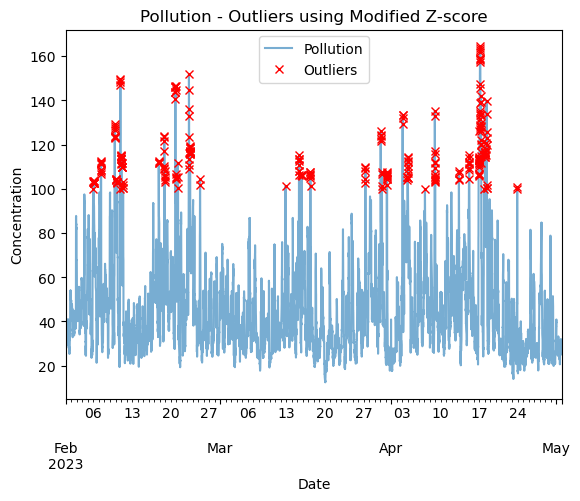

In [44]:
plot_outliers(outliers, df2, 'Outliers using Modified Z-score')

In [45]:
def iqr_outliers(data, p):
    q1, q3 = np.percentile(data, [25, 75])
    IQR = q3 - q1
    lower_fence = q1 - (p * IQR)
    upper_fence = q3 + (p * IQR)
    return data[(data['WeightedCombination'] > upper_fence) | (data['WeightedCombination'] < lower_fence)]
outliers=iqr_outliers(df2,2.5)
print(outliers)

                     WeightedCombination
DateTime                                
2023-02-09 19:45:00           126.480405
2023-02-09 20:00:00           127.394897
2023-02-09 20:15:00           128.332729
2023-02-09 20:30:00           129.174530
2023-02-09 20:45:00           122.997677
...                                  ...
2023-04-18 07:30:00           122.868907
2023-04-18 07:45:00           139.819750
2023-04-18 08:00:00           133.906583
2023-04-18 08:15:00           125.555134
2023-04-18 08:30:00           119.730509

[84 rows x 1 columns]


In [46]:
#Detecting and Plotting Outliers

def plot_outliers(outliers, data, method='KNN',
                 halignment = 'right',
                 valignment = 'bottom',
                 labels=False):

    ax = data.plot(alpha=0.6)

    if labels:
        for i in outliers['WeightedCombination'].items():
            plt.plot(i[0], i[1], 'rx')
            plt.text(i[0], i[1], f'{i[0].date()}',
                         horizontalalignment=halignment,
                         verticalalignment=valignment)
    else:
        data.loc[outliers.index].plot(ax=ax, style='rx')

    plt.title(f'Pollution - {method}')
    plt.xlabel('Date'); plt.ylabel('Concentration')

    plt.legend(['Pollution','Outliers'])
    plt.show()

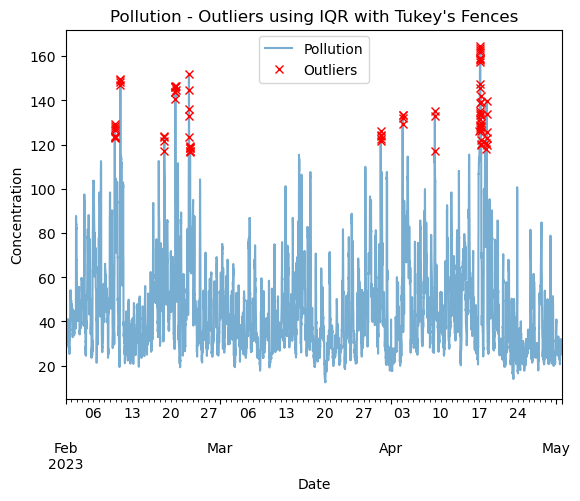

In [47]:
plot_outliers(outliers,df2,"Outliers using IQR with Tukey's Fences")

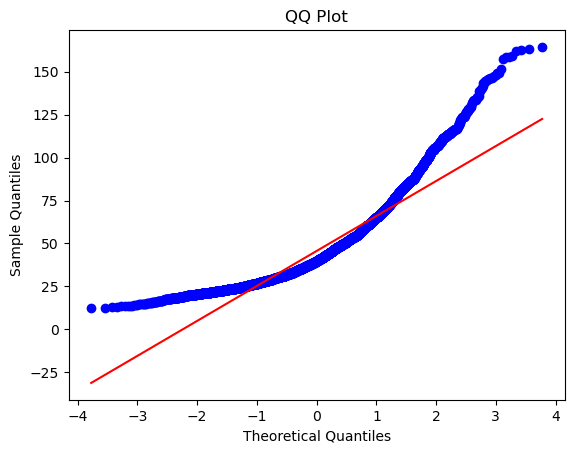

In [48]:
stats.probplot(df2['WeightedCombination'], dist='norm', plot=plt)
plt.title('QQ Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

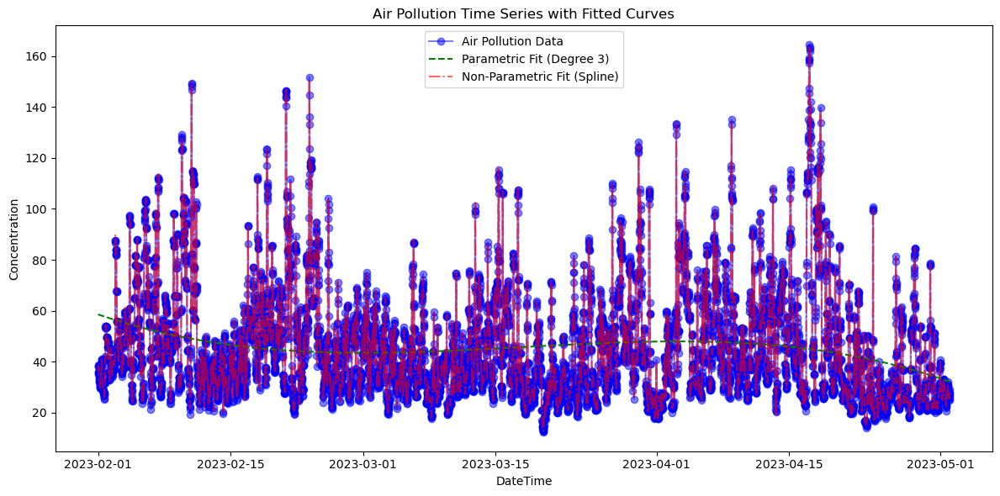

In [49]:
from scipy.interpolate import UnivariateSpline
x = np.arange(len(df2))
degree = 3  # Degree of the polynomial
coefficients = np.polyfit(x, df2['WeightedCombination'], degree)
fitted_curve = np.polyval(coefficients, x)
spline = UnivariateSpline(x, df2['WeightedCombination'])
spline_curve = spline(x)
plt.figure(figsize=(12, 6))
plt.plot(df2.index, df2['WeightedCombination'], label='Air Pollution Data', marker='o', linestyle='-', color='b',alpha=0.5)
plt.plot(df2.index, fitted_curve, label=f'Parametric Fit (Degree {degree})', linestyle='--', color='g')
plt.plot(df2.index, spline_curve, label='Non-Parametric Fit (Spline)', linestyle='-.', color='r',alpha=0.6)
plt.xlabel('DateTime')
plt.ylabel('Concentration')
plt.title('Air Pollution Time Series with Fitted Curves')
plt.legend()
plt.tight_layout()
plt.show()

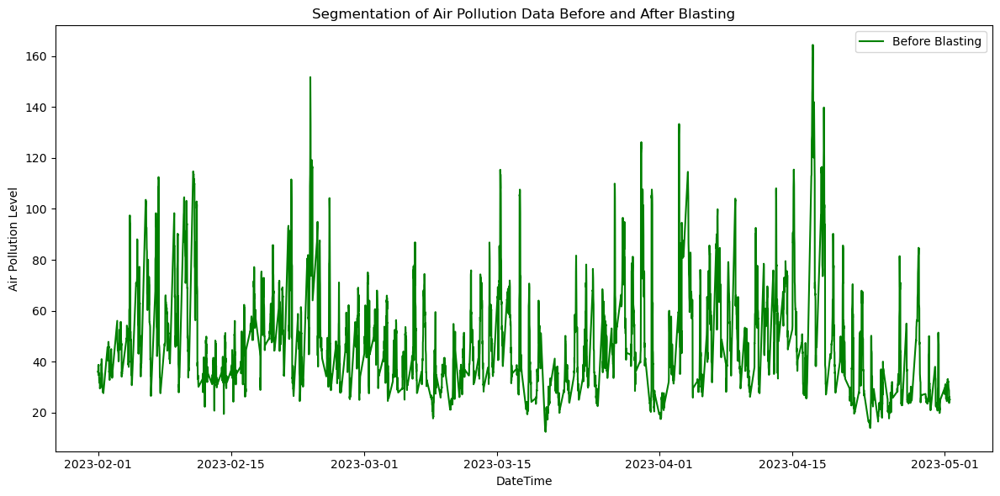

In [50]:
# Define the blasting time range (from 13:45 to 14:45)
blasting_start_time = pd.to_datetime('13:45')
blasting_end_time = pd.to_datetime('14:45')

# Segment the data before and after the blasting time
before_blasting_data = df2[df2.index.time < blasting_start_time.time()]
after_blasting_data = df2[df2.index.time >= blasting_end_time.time()]

plt.figure(figsize=(12, 6))

plt.plot(before_blasting_data.index, before_blasting_data['WeightedCombination'], label='Before Blasting', color='g')

plt.xlabel('DateTime')
plt.ylabel('Air Pollution Level')
plt.title('Segmentation of Air Pollution Data Before and After Blasting')
plt.legend()
plt.tight_layout()
plt.show()

In [51]:
print(before_blasting_data.mean())

WeightedCombination    49.055167
dtype: float64


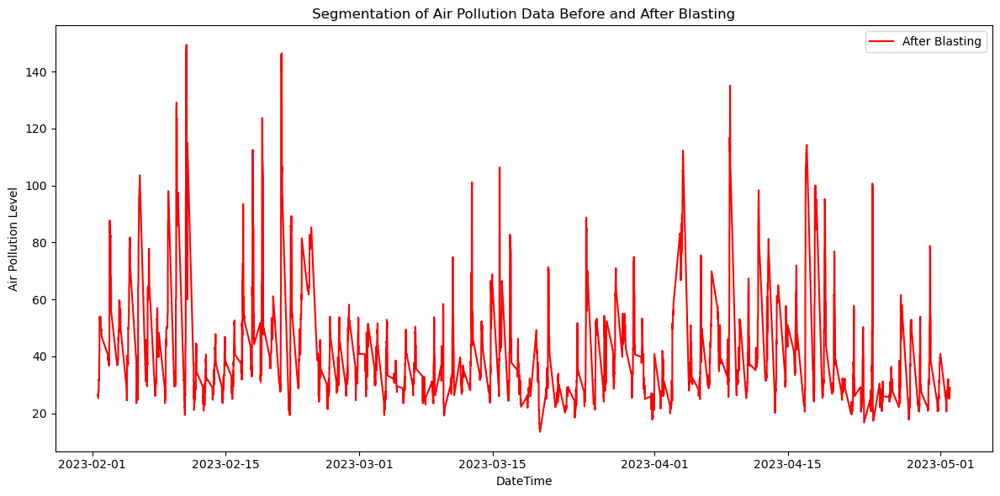

In [52]:
plt.figure(figsize=(12, 6))
plt.plot(after_blasting_data.index, after_blasting_data['WeightedCombination'], label='After Blasting', color='r')

plt.xlabel('DateTime')
plt.ylabel('Air Pollution Level')
plt.title('Segmentation of Air Pollution Data Before and After Blasting')
plt.legend()
plt.tight_layout()
plt.show()

In [53]:
print(after_blasting_data.mean())

WeightedCombination    42.00127
dtype: float64


In [ ]:
outliers2=iqr_outliers(after_blasting_data,2.5)
print(outliers2)

In [ ]:
from scipy.stats import ttest_ind
t_stat, p_value = ttest_ind(before_blasting_data.values.flatten(), after_blasting_data.values.flatten())
print("\nTwo-sample t-test Results:")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")


Two-sample t-test Results:
T-statistic: 14.543553993533013
P-value: 2.4535532889093673e-47
There are more outliers after blasting time than before blasting time which indicates increase in air pollution(peaks) after blasting time even though the mean pollution is going down after blasting.P value is significantly low .

In [ ]:
from datetime import time



# Define the blasting time range
start_time = time(13, 45)
end_time = time(14, 45)

# Create an empty list to store DataFrames for blasting periods
blasting_periods_list = []

# Iterate through each unique date in the DataFrame
for date in df.index.date:
    # Extract the DataFrame for the current date
    df_date = df2.loc[df.index.date == date]
    # Extract the DataFrame for the blasting period of the current date
    blasting_period_df = df_date.between_time(start_time, end_time)
    # Append the blasting period DataFrame to the list
    blasting_periods_list.append(blasting_period_df)

# Concatenate all DataFrames into a single DataFrame
blasting_periods_df = pd.concat(blasting_periods_list)

# Print the DataFrame for all blasting periods
print("DataFrame for All Blasting Periods:")
print(blasting_periods_df)
print(blasting_periods_df.mean())
final2=iqr_outliers(blasting_periods_df,3)

In [ ]:

from datetime import time



# Define the blasting time range
start_time = time(14, 15)
end_time = time(14, 30)

# Create an empty list to store DataFrames for blasting periods
blasting_periods_list = []

# Iterate through each unique date in the DataFrame
for date in df.index.date:
    # Extract the DataFrame for the current date
    df_date = df2.loc[df.index.date == date]
    # Extract the DataFrame for the blasting period of the current date
    blasting_period_df = df_date.between_time(start_time, end_time)
    # Append the blasting period DataFrame to the list
    blasting_periods_list.append(blasting_period_df)

# Concatenate all DataFrames into a single DataFrame
blasting_periods_df = pd.concat(blasting_periods_list)
final=iqr_outliers(blasting_periods_df,3)
print(final)